In [1]:
import IJulia

# The julia kernel has built in support for Revise.jl, so this is the 
# recommended approach for long-running sessions:
# https://github.com/JuliaLang/IJulia.jl/blob/9b10fa9b879574bbf720f5285029e07758e50a5e/src/kernel.jl#L46-L51

# Users should enable revise within .julia/config/startup_ijulia.jl:
# https://timholy.github.io/Revise.jl/stable/config/#Using-Revise-automatically-within-Jupyter/IJulia-1

# clear console history
IJulia.clear_history()

fig_width = 7
fig_height = 5
fig_format = :retina
fig_dpi = 96

# no retina format type, use svg for high quality type/marks
if fig_format == :retina
  fig_format = :svg
elseif fig_format == :pdf
  fig_dpi = 96
  # Enable PDF support for IJulia
  IJulia.register_mime(MIME("application/pdf"))
end

# convert inches to pixels
fig_width = fig_width * fig_dpi
fig_height = fig_height * fig_dpi

# Intialize Plots w/ default fig width/height
try
  import Plots

  # Plots.jl doesn't support PDF output for versions < 1.28.1
  # so use png (if the DPI remains the default of 300 then set to 96)
  if (Plots._current_plots_version < v"1.28.1") & (fig_format == :pdf)
    Plots.gr(size=(fig_width, fig_height), fmt = :png, dpi = fig_dpi)
  else
    Plots.gr(size=(fig_width, fig_height), fmt = fig_format, dpi = fig_dpi)
  end
catch e
  # @warn "Plots init" exception=(e, catch_backtrace())
end

# Initialize CairoMakie with default fig width/height
try
  import CairoMakie
  
  CairoMakie.activate!(type = string(fig_format))
  CairoMakie.update_theme!(resolution=(fig_width, fig_height))
catch e
    # @warn "CairoMakie init" exception=(e, catch_backtrace())
end
  
# Set run_path if specified
try
  run_path = raw"/Net/Groups/BGI/work_3/OEMC/oemc_sif/bin/julia/duveiller_2016"
  if !isempty(run_path)
    cd(run_path)
  end
catch e
  @warn "Run path init:" exception=(e, catch_backtrace())
end


# emulate old Pkg.installed beahvior, see
# https://discourse.julialang.org/t/how-to-use-pkg-dependencies-instead-of-pkg-installed/36416/9
import Pkg
function isinstalled(pkg::String)
  any(x -> x.name == pkg && x.is_direct_dep, values(Pkg.dependencies()))
end

# ojs_define
if isinstalled("JSON") && isinstalled("DataFrames")
  import JSON, DataFrames
  global function ojs_define(; kwargs...)
    convert(x) = x
    convert(x::DataFrames.AbstractDataFrame) = Tables.rows(x)
    content = Dict("contents" => [Dict("name" => k, "value" => convert(v)) for (k, v) in kwargs])
    tag = "<script type='ojs-define'>$(JSON.json(content))</script>"
    IJulia.display(MIME("text/html"), tag)
  end
elseif isinstalled("JSON")
  import JSON
  global function ojs_define(; kwargs...)
    content = Dict("contents" => [Dict("name" => k, "value" => v) for (k, v) in kwargs])
    tag = "<script type='ojs-define'>$(JSON.json(content))</script>"
    IJulia.display(MIME("text/html"), tag)
  end
else
  global function ojs_define(; kwargs...)
    @warn "JSON package not available. Please install the JSON.jl package to use ojs_define."
  end
end


# don't return kernel dependencies (b/c Revise should take care of dependencies)
nothing


[ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]


┌ Warning: backend `GR` is not installed.
└ @ Plots /Net/Groups/BGI/people/dpabon/bin/julia_packages/packages/Plots/sxUvK/src/backends.jl:43


[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a]


In [2]:
using Pkg

Pkg.activate("/Net/Groups/BGI/work_3/OEMC/oemc_sif/bin")

using LinearAlgebra, Optim, Plots, Dates

using DimensionalData, YAXArrays, Zarr, Statistics, LineSearches, Revise

using Rasters: Center
using Rasters

  Activating project at `/Net/Groups/BGI/work_3/OEMC/oemc_sif/bin`


[ Info: Precompiling Zarr [0a941bbe-ad1d-11e8-39d9-ab76183a1d99]


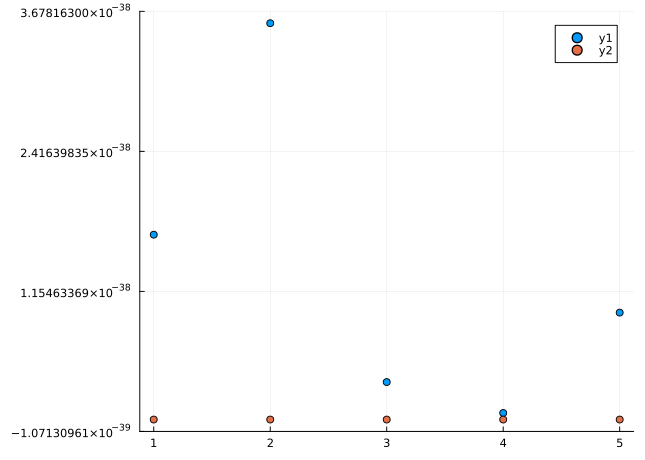

In [3]:
function focalWeightFilter(x)
    scale_fact = x
    mWm = scale_fact * 3
    xCent = repeat([-scale_fact, 0, scale_fact], inner=(x,mWm))'
    yCent = repeat([scale_fact, 0, -scale_fact], inner=(x, mWm))
    vPos = collect(1:scale_fact) .- (scale_fact / 2 + 0.5)
    xPos = repeat(vPos, outer=(x,mWm))'
    yPos = repeat(sort(vPos, rev=true), outer = (x,mWm))
    dista = -(sqrt.((xPos - xCent).^2 + (yPos - yCent).^2) ./ scale_fact)
    dista[isinf.(dista)] .= 0
    dista = dista .- (minimum(dista) - 0.000001)
    dista = dista .+ 0.1
    weights_matrix = fill(NaN, (mWm, mWm))
    
    for n in 1:scale_fact
        j = n - ((n - 1) ÷ scale_fact) * scale_fact
        k = scale_fact .* (0:2) .+ j
        
        for m in 1:scale_fact
            o = scale_fact .* (0:2) .+ m
            distaSum = sum(dista[o, k])
            weights_matrix[o, k] .= dista[o, k] ./ distaSum
        end
    end
    
    return weights_matrix
end

focalWeightFilter(3)

# Weighted focal filter (gaussian)

function gaussianWeightFilter(x)
    scale_fact = x
    mWm = scale_fact * 3
    yM = repeat(1:mWm, outer=(1,mWm))
    xM = repeat(1:mWm, outer=(1,mWm))'
    
    dista = exp.(-(((xM .- (scale_fact * 1.5)).^2) .+ ((yM .- (scale_fact * 1.5)).^2))./ (2 * scale_fact^2))

    weights_matrix = fill(NaN, mWm, mWm)

    for n in 1:scale_fact
        j = n - ((n - 1) ÷ scale_fact) * scale_fact
        k = scale_fact .* (0:2) .+ j
        for m in 1:scale_fact
            o = scale_fact .* (0:2) .+ m
            distaSum = sum(dista[o, k])
            weights_matrix[o, k] = dista[o, k] / distaSum
        end
    end

    return weights_matrix
end


# cost function

function costfun(b,VI,ET,LST,sif_ob)
    sif_pred = vegetation(VI, b[1], b[2]) .* water(ET, b[3], b[4]) .* temperature(LST, b[5], b[6])
    
    return sum((sif_pred .- sif_ob).^2)
    
end


# model components

function vegetation(VI, b1, b2)
    b2 .* (VI.^b1)
end

function water(ET, b3, b4)
    1 ./(1 .+exp.(b3.*(-ET.+b4)))
end

function temperature(LST, b5, b6)
    exp.(-0.5.*((LST.+b5)./b6).^2) 
end

function sif(VI, ET, LST, b)
    return vegetation(VI, b[1], b[2]) .* water(ET, b[3], b[4]) .* temperature(LST, b[5], b[6])
end

## Testing the functions ##

param_ini=[1, 2, 50.0, 0, -295, 10]

param_min=[0.5, 0.1, 0.0, -1, -310, 1]
param_max=[1.5, 5, 500.0, 1, -290, 50]


vi = [0.3,0.2,0.4, 0.8, 0.2]
et = [100.,200.,120., 40., 50.]
lst  = [28.,30.,25., 21., 28.]

sif_ob = sif(vi, et, lst, [1.35, 3, 120, -0.5, -291, 20])


inner_optimizer = LBFGS()

test = optimize(b -> costfun(b, vi, et, lst, sif_ob), param_min, param_max, param_ini, Fminbox(inner_optimizer))


Optim.minimizer(test)

Plots.scatter([sif_ob sif(vi,et,lst,Optim.minimizer(test))])

In [4]:
#sif_gridding = `nohup julia ./gridL2_Dates.jl --latMin 29 --latMax 71 --lonMin -30 --lonMax 89 --dLat 0.05 --dLon 0.05  --dDays 8 --startDate 2020-01-01 --stopDate 2020-12-31  --Dict specifications.json  -o /Net/Groups/BGI/scratch/jgens/TROPOSIF/gridded/Europe_h17-h20_v2-v5/Europe_h17-h20_v2-v5_005_8daily_2020.nc &`

# run the gridding of TROPOMI product.

# run(sif_gridding)


# See preprocessing_jhoannes files for the migrations steps from Netcdf to Zarr

In [5]:
sif_cube = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/SIF_TROPOMI_gridded_10km_filtered_europe_2018-05-04_2020-12-26.zarr/"))

480×480×952×5 YAXArray{Float32,4} with dimensions: 
  X Sampled{Int64} 1:1:480 ForwardOrdered Regular Points,
  Y Sampled{Int64} 1:1:480 ForwardOrdered Regular Points,
  Ti Sampled{DateTime} DateTime[2018-05-04T00:00:00, …, 2020-12-26T00:00:00] ForwardOrdered Irregular Points,
  Dim{:Variable} Categorical{String} String["SIF_ERROR_743", "lat", "SIF_743", "SIF_Corr_743", "lon"] Unordered
Total size: 4.09 GB


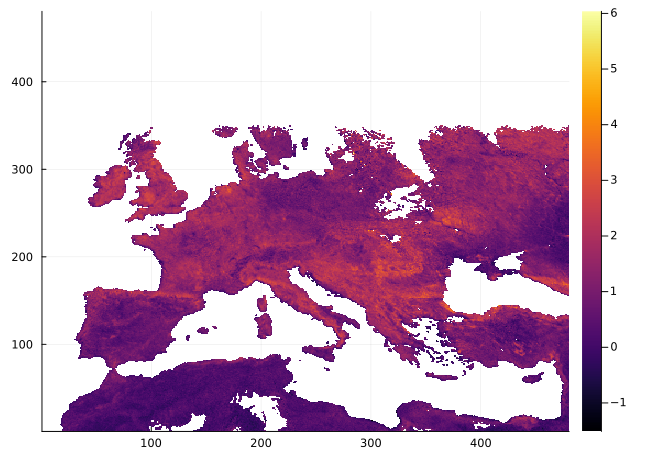

In [6]:
sif_cube_low = sif_cube[Ti = Between(DateTime("2018-07-01"),DateTime("2018-07-31")), Variable = At("SIF_743")]

heatmap(sif_cube_low.data[:,:,1])

In [7]:
lst_cube = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/LST_Sentinel3_gridded_1km_europe_2018-01-04_2020-12-29.zarr/"))

## selecting only 2018-07

lst_cube_high = lst_cube[Ti = Between(DateTime("2018-07-01"),DateTime("2018-07-31")), Variable = At("LST")]

4800×4800×4 YAXArray{Float32,3} with dimensions: 
  X Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Y Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Ti Sampled{DateTime} DateTime[2018-07-06T00:00:00, …, 2018-07-30T00:00:00] ForwardOrdered Irregular Points
Total size: 351.56 MB


Progress:   6%|██▋                                      |  ETA: 0:07:46

Progress:  13%|█████▎                                   |  ETA: 0:05:46

Progress:  19%|███████▉                                 |  ETA: 0:04:49

Progress:  26%|██████████▋                              |  ETA: 0:04:06

Progress:  32%|█████████████▎                           |  ETA: 0:03:33

Progress:  39%|███████████████▉                         |  ETA: 0:03:06

Progress:  45%|██████████████████▌                      |  ETA: 0:02:42

Progress:  52%|█████████████████████▏                   |  ETA: 0:02:20

Progress:  58%|███████████████████████▊                 |  ETA: 0:02:00

Progress:  65%|██████████████████████████▌              |  ETA: 0:01:40

Progress:  71%|█████████████████████████████▏           |  ETA: 0:01:21

Progress:  77%|███████████████████████████████▊         |  ETA: 0:01:02

Progress:  84%|██████████████████████████████████▍      |  ETA: 0:00:44

Progress:  90%|█████████████████████████████████████    |  ETA: 0:00:27

Progress:  97%|███████████████████████████████████████▋ |  ETA: 0:00:09

Progress: 100%|█████████████████████████████████████████| Time: 0:04:35


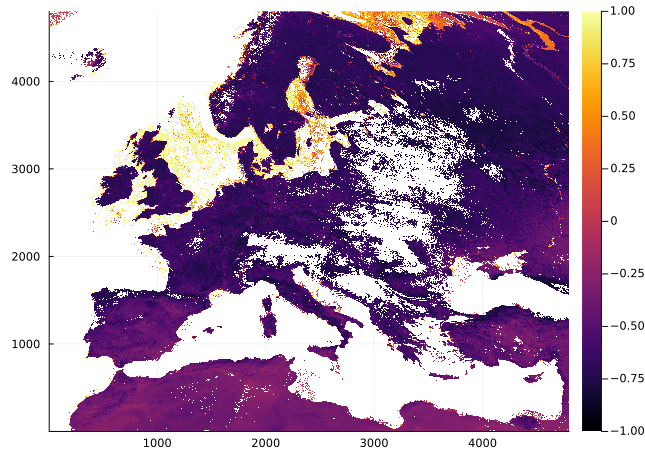

In [8]:
modis_cube = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/MC43A4_gridded_1km_europe_2018-05-01_2020-12-31_YAXA.zarr/"))


## selecting only 2018-07


modis_cube_high = modis_cube[Ti = Between(DateTime("2018-07-01"),DateTime("2018-07-31"))]

# Computing NDWI

function ndwi(out, b4,b2)
    if !isnan.(b4) && !isnan.(b2) && !isinf.(b4) && !isinf.(b2)
        out .= (b4[:]-b2[:])/(b4[:] + b2[:])

    else
        out .= NaN32
    end
end

indims = (InDims(), InDims())

outdims = OutDims(Dim{:Variable}(["NDWI"]))

ndwi_cube_high = mapCube(ndwi, (modis_cube_high[Variable = At("4")], modis_cube_high[Variable = At("2")]), indims = indims, outdims=outdims)

# quick check
heatmap(ndwi_cube_high.data[:,:,3,1])

In [9]:
sentinel_3_cube = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/OLCI_Sentinel3_gridded_1km_europe_2018-01-04_2020-12-29.zarr/"))

sentinel_3_cube.Variable
## selecting only OTCI and 2018-07

otci_cube_high = sentinel_3_cube[Variable = At("OGVI"), Ti = Between(DateTime("2018-07-01"),DateTime("2018-07-31"))]

4800×4800×4 YAXArray{Float32,3} with dimensions: 
  X Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Y Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Ti Sampled{DateTime} DateTime[2018-07-06T00:00:00, …, 2018-07-30T00:00:00] ForwardOrdered Irregular Points
Total size: 351.56 MB


In [10]:
lookup(sif_cube_low, :Ti)
lookup(lst_cube_high, :Ti)
lookup(ndwi_cube_high, :Ti)
lookup(otci_cube_high, :Ti)

function temporal_mean(out, in)
    if !all(isnan, in)
        out .= mean(filter(!isnan, in))
    else
        out .= NaN32 
    end
    
end

indims = InDims(:Ti)
outdims = OutDims()

sif_cube_low_july = mapCube(temporal_mean, sif_cube_low, indims = indims, outdims = outdims)



lst_cube_high_july = mapCube(temporal_mean, lst_cube_high, indims = indims, outdims = outdims)

ndwi_cube_high_july = mapCube(temporal_mean, ndwi_cube_high, indims = indims, outdims = outdims)

otci_cube_high_july = mapCube(temporal_mean, otci_cube_high, indims = indims, outdims = outdims)

┌ Warning: There are still cache misses
└ @ YAXArrays.DAT /Net/Groups/BGI/people/dpabon/bin/julia_packages/packages/YAXArrays/no0he/src/DAT/DAT.jl:1076


Progress:  33%|█████████████▋                           |  ETA: 0:00:36

Progress:  50%|████████████████████▌                    |  ETA: 0:00:28

Progress:  67%|███████████████████████████▍             |  ETA: 0:00:19

Progress:  83%|██████████████████████████████████▏      |  ETA: 0:00:09

Progress: 100%|█████████████████████████████████████████| Time: 0:00:55


4800×4800 YAXArray{Union{Missing, Float32},2} with dimensions: 
  X Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Y Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points
Total size: 87.89 MB


In [11]:
#=
savecube(sif_cube_low_july, "/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/sif_cube_low_july.zarr"; overwrite = true)
savecube(lst_cube_high_july, "/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/lst_cube_high_july.zarr")
savecube(otci_cube_high_july, "/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/otci_cube_high_july.zarr")
savecube(ndwi_cube_high_july, "/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/ndwi_cube_high_july.zarr")
=#

In [12]:
sif_cube_low_july = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/sif_cube_low_july.zarr"))

# let's match X and Y in the other cubes

axlist = (
    Dim{:X}(1:480),
    Dim{:Y}(1:480))

sif_cube_low_july = YAXArray(axlist, sif_cube_low_july.data[:,:])


lst_cube_high_july = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/lst_cube_high_july.zarr"))

otci_cube_high_july = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/otci_cube_high_july.zarr"))

ndwi_cube_high_july = Cube(open_dataset("/Net/Groups/BGI/work_3/OEMC/oemc_sif/data/ndwi_cube_high_july.zarr"))

4800×4800 YAXArray{Union{Missing, Float32},2} with dimensions: 
  X Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points,
  Y Sampled{Int64} 1:1:4800 ForwardOrdered Regular Points
name: NDWI
Total size: 87.89 MB


In [13]:
function aggregate_space(out, incube; scale_factor, axes)
    test = Raster(replace(incube, NaN32 => missing), axes)
    test_out = aggregate(mean, test, (X(scale_factor), Y(scale_factor)); skipmissingval=true)
    out .= replace(test_out.data, missing => NaN32)
end


indims = InDims(:X,:Y)

outdims = OutDims(Dim{:X}(1:480), Dim{:Y}(1:480))

axes = lst_cube_high.axes[1:2]

scale_factor = 10

10